 ### Solve the wave equation and estimate the wave velocity using PINNs (1/2). 
The goal of the forward problem is to compute the pressure field $p(x,y,t)$ that satisfies the wave equation with source term $s(x,y,t)$,
$$\frac{\partial^2 p}{\partial x^2} + \frac{\partial^2 p}{\partial y^2} - \frac{1}{c^2} \frac{\partial^2 p}{\partial t^2} = s.$$
We start by assuming that the speed of sound in the medium, $c$, is known and constant. Later on we will consider the inverse problem of estimating the wave velocity as a function of space, $c(x,y)$. Without loss of generality, we define $ s(x,y,t) \equiv 0 $, and introduce the source(s) as an initial perturbation at an early time.  

The inference of $p(x,y,t)$ and $c(x,y)$ can be based on:
- Observed data 
- Initial conditions
- Boundary conditions
- Physics via the undelying PDE

We will use physics-informed neural networks (PINNs) for the task of estimating $p$. 
We start by importing the needed packages and defining a class for the neural network as well as a few auxiliary functions. 

`conda create -n wave_pinn_tutorial python=3`

`conda activate workshop`

`conda install jupyter numpy matplotlib`

`conda install pytorch torchvision torchaudio -c pytorch`

In [1]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from tqdm import tqdm
from seismic_cpml.seismic_CPML_2D_pressure_second_order import seismicCPML2D

device = 'cuda' if torch.cuda.is_available() else 'cpu'
dtype = np.float32

In [2]:
class FCN(nn.Module):
        def __init__(self, n_in, n_out, n_ffeatures, n_hidden, n_layers):
            super().__init__()
            self.n_ffeatures = n_ffeatures
            if n_ffeatures != 0:
                self.B = torch.nn.Parameter(torch.randn((n_in, n_ffeatures)))
                self.b = torch.nn.Parameter(torch.randn((1, n_ffeatures)))
                n_in = n_ffeatures

            activation = nn.Tanh
            self.fcs = nn.Sequential(*[
                            nn.Linear(n_in, n_hidden),
                            activation()])
            self.fch = nn.Sequential(*[
                            nn.Sequential(*[
                                nn.Linear(n_hidden, n_hidden),
                                activation()]) for _ in range(n_layers-1)])
            self.fce = nn.Linear(n_hidden, n_out)

        def forward(self, r):
            if self.n_ffeatures != 0:
                r = torch.cos( 2*np.pi*r @ self.B + self.b ) # Fourier mapping
            r = self.fcs(r)
            r = self.fch(r)
            r = self.fce(r)
            return r
        
def weights_init(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_normal_(m.weight)
        torch.nn.init.zeros_(m.bias)

def pde(p, r, c):
    p_r = torch.autograd.grad(p, r, torch.ones_like(p), create_graph=True)[0]
    p_xx = torch.autograd.grad(p_r[:,0], r, torch.ones_like(p_r[:,0]), create_graph=True)[0][:,0:1]
    p_yy = torch.autograd.grad(p_r[:,1], r, torch.ones_like(p_r[:,1]), create_graph=True)[0][:,1:2]
    p_tt = torch.autograd.grad(p_r[:,2], r, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,2:3]
    pde_res = p_xx + p_yy - p_tt/c**2
    return pde_res

def absorbing_boundary(p, r_bound, id_bound, c):
    p_r = torch.autograd.grad(p, r_bound, torch.ones_like(p), create_graph=True)[0]
    p_tt = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,2:3]
    if id_bound == 1:
        p_ty = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,1:2]
        p_xx = torch.autograd.grad(p_r[:,0], r_bound, torch.ones_like(p_r[:,0]), create_graph=True)[0][:,0:1]
        res_bound = -p_ty + p_tt/c - c*p_xx/2
    elif id_bound == 2:
        p_ty = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,1:2]
        p_xx = torch.autograd.grad(p_r[:,0], r_bound, torch.ones_like(p_r[:,0]), create_graph=True)[0][:,0:1]
        res_bound = p_ty + p_tt/c - c*p_xx/2
    elif id_bound == 3:
        p_tx = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,0:1]
        p_yy = torch.autograd.grad(p_r[:,1], r_bound, torch.ones_like(p_r[:,1]), create_graph=True)[0][:,1:2]
        res_bound = -p_tx + p_tt/c - c*p_yy/2
    elif id_bound == 4:
        p_tx = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,0:1]
        p_yy = torch.autograd.grad(p_r[:,1], r_bound, torch.ones_like(p_r[:,1]), create_graph=True)[0][:,1:2]
        res_bound = p_tx + p_tt/c - c*p_yy/2
    return res_bound

def loss_grad_norm(loss, model):
    loss_grad_norm = 0
    loss_clone = loss.clone()
    for params in model.parameters():
        loss_grad = torch.autograd.grad(loss_clone, params, retain_graph=True, allow_unused=True, materialize_grads=True)[0]
        loss_grad_norm += torch.sum(loss_grad**2)
    loss_grad_norm = loss_grad_norm**0.5
    loss_grad_norm = loss_grad_norm.detach().numpy()
    return loss_grad_norm

def update_lambda(model, loss_lst, lamb_lst, alpha):
    grad = []
    for loss in loss_lst:
        grad.append(loss_grad_norm(loss, model))
    grad_sum = sum(grad)
    lamb = []
    for i in range(len(grad)):
        lamb_hat = grad_sum / grad[i]
        if np.isnan(lamb_hat) or np.isinf(lamb_hat):
            lamb_hat = 1
        lamb_new = np.min((alpha*lamb_lst[i] + (1-alpha)*lamb_hat, 1e6))
        lamb.append(lamb_new)
    return lamb

def xyt_tensor(rxy, t):
    n_t = len(t)
    n_xy = len(rxy)
    r = np.column_stack(
        (np.repeat(rxy, n_t, axis=0),
         np.tile(t, n_xy)))
    r = torch.tensor(r, dtype=torch.float32).view(-1,3).requires_grad_(True)
    r = r.to(device)
    return r

def rand_colloc(L, T, n):
    xy = L * np.random.rand(n, 2)
    t = T * np.random.rand(n)
    r = xyt_tensor(xy, t)
    return r

def rand_bound(L, T, n, id_bound):
    t = T * np.random.rand(n)
    rand = L*np.random.rand(n)
    if id_bound == 1:
        xy = np.column_stack((rand, np.zeros(n)))
    elif id_bound == 2:
        xy = np.column_stack((rand, L*np.ones(n)))
    elif id_bound == 3:
        xy = np.column_stack((np.zeros(n), rand))
    elif id_bound == 4:
        xy = np.column_stack((rand, np.zeros(n)))
    r = xyt_tensor(xy, t)
    return r

### Problem setup
We define a 2+1D domain. The spatial domain is a square of side length $L=10$ km, and the time domain has a duration $T=4$ s. The speed of sound is fixed to a constant value, $c=3$ km/s. The source is modelled as a Gaussian pulse of width `gpulse_std`. The source is placed inside the domain, centered at `r_source`.

It is important to scale the dimensions of the domain so that none of the terms in the PDE is very large or very small. For details on this see *section 3. Non-dimensionalization* in [Wang 2023] https://doi.org/10.48550/arXiv.2308.08468 and the book *Scaling of Differential Equations* by Langtangen and Pedersen. 

We use B. Moseley's python implementation of the CPML code https://github.com/benmoseley/seismic-simulation-complex-media.git to simulate wave propagation. Even if right now the velocity $c$ is just a constant, we can also define arbitrary velocity fields (see notebook 2/2). We compute and plot the reference solution.

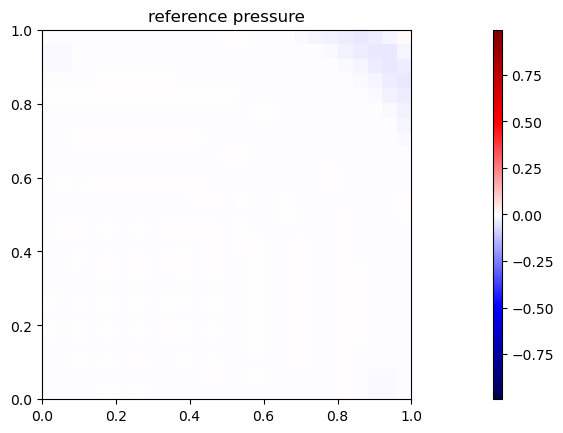

In [3]:
# define domain
L = 10/2
T = 4/2
rho = 1

# velocity
c = 3

# scaling
T = T*c/L
L = L/L
c = 1

# define simulation domain
n_T = int(150/2)
t = np.linspace(0, T, n_T)
delta_T = t[1]

n_L = int(50/2)
r_side = np.linspace(0, L, n_L)
delta_L = r_side[1]
x, y = np.meshgrid(r_side, r_side)
r = np.column_stack((np.reshape(x,(-1,1)), np.reshape(y,(-1,1))))
r_ref = xyt_tensor(r, t)
c_field = c*np.ones(shape=(n_L, n_L), dtype=dtype)
rho_field = rho*np.ones(shape=(n_L, n_L), dtype=dtype)

# initial condition
gpulse_std = 5e-2*2
r_source = np.array([0.1, 0.1])*2
p0 = np.exp(-0.5*( ((x-r_source[0])/gpulse_std)**2 + ((y-r_source[1])/gpulse_std)**2 ))

# for the PML
n_PML = 10
f0 = 0.25 
p0 = np.pad(p0, [(n_PML, n_PML), (n_PML, n_PML)], mode="edge")
c_field = np.pad(c_field, [(n_PML, n_PML),(n_PML, n_PML)], mode="edge")
rho_field = np.pad(rho_field, [(n_PML, n_PML),(n_PML, n_PML)], mode="edge")

# compute reference field
p_ref, _ = seismicCPML2D(
                n_L+2*n_PML,
                n_L+2*n_PML,
                n_T,
                delta_L,
                delta_L,
                delta_T,
                n_PML,
                c_field,
                rho_field,
                (p0.copy(),p0.copy()),
                f0,
                dtype,
                output_wavefields=True,
                gather_is=None)

# remove PML
p_ref = p_ref[:,n_PML:-n_PML, n_PML:-n_PML]
p_ref = np.moveaxis(p_ref, 0, -1)
c_field = c_field[n_PML:-n_PML, n_PML:-n_PML]
rho_field = rho_field[n_PML:-n_PML, n_PML:-n_PML]

# plot reference field (it might take a few seconds)
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
p_max = np.max(np.abs(p_ref))
frames = []
fig, [ax1, ax2] = plt.subplots(1, 2, gridspec_kw={"width_ratios":[50,1]})
cmap = matplotlib.cm.seismic
norm = matplotlib.colors.Normalize(vmin=-p_max, vmax=p_max)
cbar = matplotlib.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, orientation='vertical')
ax1.set_title('reference pressure')
for i in range(n_T):   
    p_plot = p_ref[:,:,i]
    img = ax1.imshow(p_plot, vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L], animated=True)
    frames.append([img])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)

In [4]:
plt.close()

### Generate data
We now define the observed data used for estimating the field. Our data will the pressure field on a number of points alinged with the x-axis (black triangles in the left figure). The observed data, called `p_data`, is shown in the rigth figure.
In addition, we assume that we know the position, propagation direction, and shape of the source. This is enconded in two early-time snapshots (see [Rasht-Behesht 2022] https://doi.org/10.1029/2021JB023120). We will call those two spnashots `p_ini`. With this information we are ready to train our PINN. 

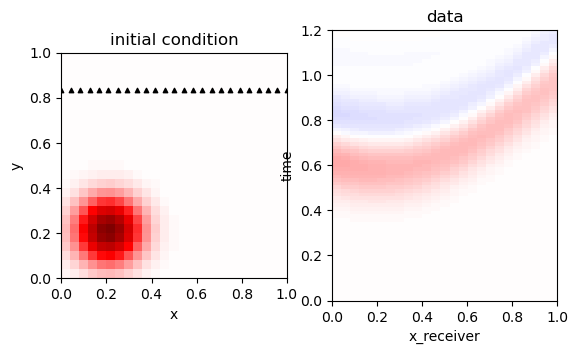

In [5]:
x_data = x[20,:]
y_data = y[20,:]
xy_data = np.column_stack((x_data, y_data))
r_data = xyt_tensor(xy_data, t)
p_data = torch.tensor(p_ref[20,:,:], dtype=torch.float32)

# Plot data
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.set_title('initial condition')
ax2.set_title('data')
ax1.set_ylabel('y')
ax1.set_xlabel('x')
ax2.set_ylabel('time')
ax2.set_xlabel('x_receiver')
ax1.imshow(p_ref[:,:,0], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L])
ax1.scatter(x_data, y_data, s=10, c='black', marker='^')
ax2.imshow(p_data.T, vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,T])
plt.show()

p_data = p_data.to(device)

# Initial condition
t_ini = t[0:2]
r_ini = xyt_tensor(r, t_ini)
p_ini = p_ref[:,:,0:2].reshape(-1,2)
p_ini = torch.tensor(p_ini, dtype=torch.float32, device=device)


### PINN
We start with a fully-connected neural network with 3 inputs, $(x,y,t)$, and 1 output, $p$. We define the number of hidden units per layer, `n_hidden`, and the number of layers, `n_layers`. We initialize the weights using the Glorot scheme as suggested in [Wang 2023].

 #### Fourier features
 Neural networks (not only PINNs) struggle to learn the high-frequency content of functions. This is sometmes called the NN 'spectral bias'. High-frequencies can be associated, for example, to function discontinuities or jumps, such as edges in an image (here are some great examples in image processing https://bmild.github.io/fourfeat/). In order to alleviate this issue [Tancik 2020]
 https://doi.org/10.48550/arXiv.2006.10739 proposed a simple Fourier mapping $\gamma(\mathbf{r})$ of the inputs of the network. Later on, Fourier features have also been applied to PINNs to approximate solutions to PDEs with high frequencies and multi-scale features [Wang 2021b] https://doi.org/10.1016/j.cma.2021.113938 In its original formulation, the Fourier mapping is computed as

 $$ \gamma(\mathbf{r}) = \begin{bmatrix} \cos(\mathbf{Br})\\ \sin(\mathbf{Br})\end{bmatrix} $$

where $\mathbf{B}$ is a matrix with dimensions `n_in` x `n_ffeatures`. The entries of $\mathbf{B}$ are sampled from a normal distribution with std $\sigma$.  It was shown, however, that the choice of $\sigma$ is not straight forward since it depends on the frequency content of the function that we want to approximate. Here we change the formulation slightly, and compute the Fourier mapping as 

 $$ \gamma(\mathbf{r}) = \cos(\mathbf{Br + b}) $$

 where $\mathbf{B}$ and $\mathbf{b}$ are treated as network parameters so that they will be learned during training via gradient descent. Note that this is very similar to the SIREN activation function. In our case we just apply it to the input as a first layer.

 To test the Fourier features let's train the network only on the initial conditions. Notice that we *know* the first two of snapshots so the network shouldn't have much trouble learning that. Lets train first a network without Fourier mapping.  

 20%|█▉        | 591/3000 [00:00<00:03, 623.83it/s]

[  500] loss: 16.273*1e-3


 35%|███▌      | 1059/3000 [00:01<00:03, 633.89it/s]

[ 1000] loss: 15.641*1e-3


 54%|█████▍    | 1625/3000 [00:02<00:02, 606.77it/s]

[ 1500] loss: 14.132*1e-3


 71%|███████   | 2130/3000 [00:03<00:01, 613.61it/s]

[ 2000] loss: 6.344*1e-3


 87%|████████▋ | 2597/3000 [00:04<00:00, 661.52it/s]

[ 2500] loss: 1.663*1e-3


100%|██████████| 3000/3000 [00:04<00:00, 619.23it/s]


[ 3000] loss: 0.454*1e-3


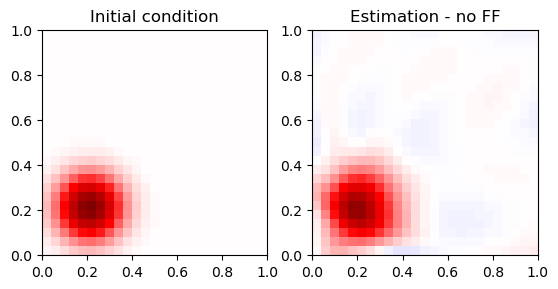

In [6]:
n_in = 3
n_out = 1
n_ffeatures = 0
n_hidden = 64
n_layers = 3
n_epochs = int(3e3)
lamb = [1] # initialise lambdas

model = FCN(n_in, n_out, n_ffeatures, n_hidden, n_layers)
model = model.to(device)
model.apply(weights_init)

mse_loss = nn.MSELoss()
optimiser = torch.optim.Adam(model.parameters(), lr=1e-4)

for i in tqdm(range(n_epochs)):
    optimiser.zero_grad()
    
    # initial condition loss
    p = model(r_ini)
    p = p.reshape(-1, 2)
    loss_ini = mse_loss(p, p_ini)

    # backpropagate
    loss_ini.backward()
    optimiser.step()

    # print loss
    if i % 500 == 499:    # print every 500 epochs
        print('[%5d] loss: %.3f*1e-3' %
        (i + 1, loss_ini.item()*1e3))

# Plot reference and estimation
p_est = model(r_ini)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, 2))
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Initial condition')
ax1.imshow(p_ref[:,:,0], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L])
ax2.title.set_text('Estimation - no FF')
ax2.imshow(np.reshape(p_est[:,1], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L])
plt.show()

It's clear that after 3000 epochs the NN has only learned the low frequency content of the initial conditions.
Let's see what happens when we use the Fourier mapping. 

 18%|█▊        | 554/3000 [00:01<00:04, 543.62it/s]

[  500] loss: 0.731*1e-3


 35%|███▌      | 1064/3000 [00:01<00:03, 519.64it/s]

[ 1000] loss: 0.272*1e-3


 52%|█████▏    | 1571/3000 [00:02<00:02, 550.33it/s]

[ 1500] loss: 0.145*1e-3


 69%|██████▉   | 2076/3000 [00:03<00:01, 546.02it/s]

[ 2000] loss: 0.088*1e-3


 86%|████████▌ | 2580/3000 [00:04<00:00, 521.44it/s]

[ 2500] loss: 0.058*1e-3


100%|██████████| 3000/3000 [00:05<00:00, 543.78it/s]


[ 3000] loss: 0.040*1e-3


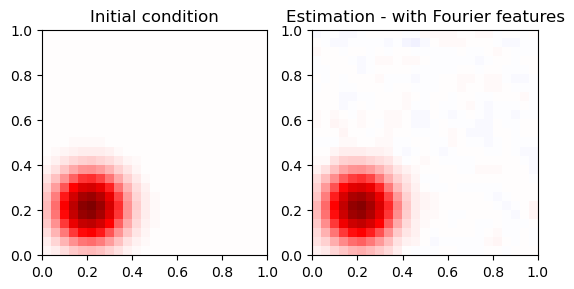

In [7]:
n_ffeatures = 64

model = FCN(n_in, n_out, n_ffeatures, n_hidden, n_layers)
model = model.to(device)
model.apply(weights_init)

mse_loss = nn.MSELoss()
optimiser = torch.optim.Adam(model.parameters(), lr=1e-4)

for i in tqdm(range(n_epochs)):
    optimiser.zero_grad()
    
    # initial condition loss
    p = model(r_ini)
    p = p.reshape(-1, 2)
    loss_ini = mse_loss(p, p_ini)

    # backpropagate
    loss_ini.backward()
    optimiser.step()

    # print loss
    if i % 500 == 499:    # print every 500 epochs
        print('[%5d] loss: %.3f*1e-3' %
        (i + 1, loss_ini.item()*1e3))

# Plot reference and estimation
p_est = model(r_ini)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, 2))
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Initial condition')
ax1.imshow(p_ref[:,:,0], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L])
ax2.title.set_text('Estimation - with Fourier features')
ax2.imshow(np.reshape(p_est[:,1], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L])
plt.show()

One can see that the Fourier mapping helps to estimate the high frequencies present in the initial condition.
### Loss function
The loss function $\mathcal{L}$ is defined as a weighted sum of a data term, $\mathcal{L}_\text{data}$, a physics term, $\mathcal{L}_\text{pde}$, and an initial condition term, $\mathcal{L}_\text{ini}$, such that
$$ \mathcal{L} = \lambda_\text{data}\mathcal{L}_\text{data} + \lambda_\text{pde}\mathcal{L}_\text{pde} + \lambda_\text{ini}\mathcal{L}_\text{ini}.$$
Of course, one can also define a loss term for the boundary conditions (BCs) in the same manner, but we don't have BCs here, so we leave it out for now. This is a 'soft-constrained' formulation, meaning that the conditions (data, initial, boundary) are not enforced in a hard way. This soft-constrained PINN is easy to formulate, but on the downside the learned function might not satisfy the conditions exactly.

The choice of the weights $\lambda = [\lambda_\text{data}, \lambda_\text{pde}, \lambda_\text{ini}]$ can be a delicate one. One can choose it 'manually' by trying out different values and keeping the one that give reasonable results. However manually finding a $\lambda$ that balances the relative weight of the loss terms properly can be very tricky and tedious (specially when we have a loss composed by more than two terms). 

Here we implement an anneling algorithm to automatically choose $\lambda$, as proposed in [Wang 2021] https://doi.org/10.48550/arXiv.2001.04536. PINNs are notoriously difficult to train, one of the reasons being that the gradients (wrt to the network parameters $\theta$) of the different terms in the loss function can be very different. This unbalance can lead to unstable gradient descent during traning. As a way to alleviate this, $\lambda$ is chosen based on the gradient of each of the loss terms.
The algorithm is summarized as: 

if (`i_epoch` mod `n_lamb_update`) = 0 compute:
$$ \hat{\lambda}_\text{data} = \frac{||\nabla_\theta \mathcal{L}_\text{data}|| + ||\nabla_\theta \mathcal{L}_\text{pde}|| + ||\nabla_\theta \mathcal{L}_\text{ini}|| } {||\nabla_\theta \mathcal{L}_\text{data}||} $$

$$ \hat{\lambda}_\text{pde} = \frac{||\nabla_\theta \mathcal{L}_\text{data}|| + ||\nabla_\theta \mathcal{L}_\text{pde}|| + ||\nabla_\theta \mathcal{L}_\text{ini}|| } {||\nabla_\theta \mathcal{L}_\text{pde}||} $$

$$ \hat{\lambda}_\text{ini} = \frac{||\nabla_\theta \mathcal{L}_\text{data}|| + ||\nabla_\theta \mathcal{L}_\text{pde}|| + ||\nabla_\theta \mathcal{L}_\text{ini}|| } {||\nabla_\theta \mathcal{L}_\text{ini}||} $$
Then update the weights using a moving average with parameter $\alpha$:
$$ \lambda_\text{new} = \alpha \lambda_\text{old} + (1-\alpha)\hat{\lambda}_\text{new}$$
We also set a $\lambda_\text{max}$ so that $ \lambda = \min\{\lambda_\text{new}, \lambda_\text{max}\}$
 to avoid that it grows unbounded. 

In [8]:
n_in = 3
n_out = 1
n_ffeatures = 64
n_hidden = 64
n_layers = 3
n_colloc = 20
n_lamb_update = 100
n_warmup = 0
n_epochs = int(3e4)
lamb = [1, 1, 1] # initialise lambdas

model = FCN(n_in, n_out, n_ffeatures, n_hidden, n_layers)
model = model.to(device)
model.apply(weights_init)

mse_loss = nn.MSELoss()
optimiser = torch.optim.Adam(model.parameters(), lr=1e-4)

loss_data_hist = []
loss_pde_hist = []
loss_ini_hist = []
lamb_data_hist = []
lamb_pde_hist = []
lamb_ini_hist = []

In [9]:
for i in tqdm(range(n_epochs)):
    optimiser.zero_grad()
    
    # initial condition loss
    p = model(r_ini)
    p = p.reshape(-1, 2)
    loss_ini = mse_loss(p, p_ini)

    # data loss
    p = model(r_data)
    p = p.reshape(-1, n_T)
    loss_data = mse_loss(p, p_data)

    if i >= n_warmup:
    # pde loss
        xy_colloc = L * np.random.rand(n_colloc, 2)
        t_colloc = T * np.random.rand(n_colloc)
        r_colloc = xyt_tensor(xy_colloc, t_colloc)
        p = model(r_colloc)
        pde_res = pde(p, r_colloc, c)
        loss_pde = mse_loss(pde_res, torch.zeros_like(p))
    else:
        loss_pde = torch.zeros_like(loss_ini).requires_grad_(True)

    loss_lst = [loss_data, loss_pde, loss_ini]

    # get gradients and update lambda
    if i % n_lamb_update == 0: 
        lamb = update_lambda(model, loss_lst, lamb, 0.9)

    # total loss
    loss = loss_data + loss_pde*lamb[1]/lamb[0] + loss_ini*lamb[2]/lamb[0] 

    # backpropagate
    loss.backward()
    optimiser.step()

    # log
    loss_data_hist.append(loss_data.numpy(force=True))
    loss_pde_hist.append(loss_pde.numpy(force=True))
    loss_ini_hist.append(loss_ini.numpy(force=True))
    lamb_data_hist.append(lamb[0])
    lamb_pde_hist.append(lamb[1])
    lamb_ini_hist.append(lamb[2])

    # print loss
    if i % 500 == 499:    # print every 500 epochs
        print('[%5d] loss: %.3f*1e-3' %
        (i + 1, loss.item()*1e3))



  2%|▏         | 510/30000 [00:06<05:50, 84.10it/s]

[  500] loss: 58.327*1e-3


  3%|▎         | 1008/30000 [00:11<06:02, 79.97it/s]

[ 1000] loss: 13.457*1e-3


  5%|▌         | 1512/30000 [00:17<05:25, 87.58it/s]

[ 1500] loss: 6.938*1e-3


  7%|▋         | 2008/30000 [00:23<05:37, 82.83it/s]

[ 2000] loss: 4.190*1e-3


  8%|▊         | 2510/30000 [00:28<05:25, 84.58it/s]

[ 2500] loss: 2.900*1e-3


 10%|█         | 3012/30000 [00:34<05:16, 85.19it/s]

[ 3000] loss: 1.837*1e-3


 12%|█▏        | 3513/30000 [00:40<05:23, 81.88it/s]

[ 3500] loss: 1.373*1e-3


 13%|█▎        | 4008/30000 [00:46<05:23, 80.25it/s]

[ 4000] loss: 0.952*1e-3


 15%|█▌        | 4511/30000 [00:52<05:20, 79.49it/s]

[ 4500] loss: 0.750*1e-3


 17%|█▋        | 5010/30000 [00:59<05:19, 78.29it/s]

[ 5000] loss: 0.524*1e-3


 18%|█▊        | 5514/30000 [01:05<05:03, 80.79it/s]

[ 5500] loss: 0.416*1e-3


 20%|██        | 6007/30000 [01:11<05:00, 79.76it/s]

[ 6000] loss: 0.411*1e-3


 22%|██▏       | 6508/30000 [01:17<04:51, 80.47it/s]

[ 6500] loss: 0.373*1e-3


 23%|██▎       | 7012/30000 [01:23<04:41, 81.55it/s]

[ 7000] loss: 0.353*1e-3


 25%|██▌       | 7506/30000 [01:29<04:43, 79.48it/s]

[ 7500] loss: 0.340*1e-3


 27%|██▋       | 8006/30000 [01:34<04:36, 79.46it/s]

[ 8000] loss: 0.304*1e-3


 28%|██▊       | 8508/30000 [01:41<05:41, 62.89it/s]

[ 8500] loss: 0.333*1e-3


 30%|███       | 9015/30000 [01:47<04:12, 83.05it/s]

[ 9000] loss: 0.220*1e-3


 32%|███▏      | 9509/30000 [01:53<04:20, 78.76it/s]

[ 9500] loss: 0.177*1e-3


 33%|███▎      | 10013/30000 [01:59<03:53, 85.71it/s]

[10000] loss: 0.148*1e-3


 35%|███▌      | 10515/30000 [02:04<03:52, 83.90it/s]

[10500] loss: 0.124*1e-3


 37%|███▋      | 11010/30000 [02:10<03:57, 80.07it/s]

[11000] loss: 0.131*1e-3


 38%|███▊      | 11511/30000 [02:16<03:36, 85.50it/s]

[11500] loss: 0.078*1e-3


 40%|████      | 12012/30000 [02:22<03:36, 82.99it/s]

[12000] loss: 0.076*1e-3


 42%|████▏     | 12507/30000 [02:28<03:37, 80.48it/s]

[12500] loss: 0.127*1e-3


 43%|████▎     | 13005/30000 [02:34<03:40, 76.96it/s]

[13000] loss: 0.044*1e-3


 45%|████▌     | 13510/30000 [02:40<03:21, 81.84it/s]

[13500] loss: 0.033*1e-3


 47%|████▋     | 14014/30000 [02:46<03:14, 82.36it/s]

[14000] loss: 0.036*1e-3


 48%|████▊     | 14513/30000 [02:52<03:07, 82.76it/s]

[14500] loss: 0.056*1e-3


 50%|█████     | 15011/30000 [02:58<02:58, 83.83it/s]

[15000] loss: 0.040*1e-3


 52%|█████▏    | 15513/30000 [03:04<02:56, 82.11it/s]

[15500] loss: 0.022*1e-3


 53%|█████▎    | 16006/30000 [03:09<02:55, 79.54it/s]

[16000] loss: 0.018*1e-3


 55%|█████▌    | 16506/30000 [03:15<02:45, 81.43it/s]

[16500] loss: 0.067*1e-3


 57%|█████▋    | 17011/30000 [03:21<02:31, 85.93it/s]

[17000] loss: 0.022*1e-3


 58%|█████▊    | 17513/30000 [03:27<02:24, 86.42it/s]

[17500] loss: 0.018*1e-3


 60%|██████    | 18014/30000 [03:33<02:19, 85.67it/s]

[18000] loss: 0.017*1e-3


 62%|██████▏   | 18512/30000 [03:39<02:18, 83.04it/s]

[18500] loss: 0.017*1e-3


 63%|██████▎   | 19012/30000 [03:45<02:13, 82.45it/s]

[19000] loss: 0.023*1e-3


 65%|██████▌   | 19512/30000 [03:51<02:08, 81.37it/s]

[19500] loss: 0.030*1e-3


 67%|██████▋   | 20008/30000 [03:56<02:07, 78.11it/s]

[20000] loss: 0.017*1e-3


 68%|██████▊   | 20509/30000 [04:02<01:57, 80.99it/s]

[20500] loss: 0.031*1e-3


 70%|███████   | 21010/30000 [04:08<01:48, 83.24it/s]

[21000] loss: 0.022*1e-3


 72%|███████▏  | 21505/30000 [04:14<01:44, 81.18it/s]

[21500] loss: 0.034*1e-3


 73%|███████▎  | 22010/30000 [04:20<01:34, 84.77it/s]

[22000] loss: 0.024*1e-3


 75%|███████▌  | 22511/30000 [04:25<01:26, 86.70it/s]

[22500] loss: 0.018*1e-3


 77%|███████▋  | 23011/30000 [04:31<01:24, 82.91it/s]

[23000] loss: 0.028*1e-3


 78%|███████▊  | 23511/30000 [04:37<01:13, 88.57it/s]

[23500] loss: 0.018*1e-3


 80%|████████  | 24008/30000 [04:43<01:11, 84.24it/s]

[24000] loss: 0.014*1e-3


 82%|████████▏ | 24511/30000 [04:49<01:21, 67.46it/s]

[24500] loss: 0.017*1e-3


 83%|████████▎ | 25006/30000 [04:56<01:17, 64.31it/s]

[25000] loss: 0.012*1e-3


 85%|████████▌ | 25510/30000 [05:04<01:06, 67.83it/s]

[25500] loss: 0.022*1e-3


 87%|████████▋ | 26006/30000 [05:11<01:00, 65.82it/s]

[26000] loss: 0.015*1e-3


 88%|████████▊ | 26510/30000 [05:18<00:51, 67.82it/s]

[26500] loss: 0.016*1e-3


 90%|█████████ | 27006/30000 [05:25<00:45, 66.50it/s]

[27000] loss: 0.016*1e-3


 92%|█████████▏| 27510/30000 [05:32<00:36, 68.17it/s]

[27500] loss: 0.035*1e-3


 93%|█████████▎| 28006/30000 [05:39<00:30, 66.17it/s]

[28000] loss: 0.028*1e-3


 95%|█████████▌| 28510/30000 [05:46<00:22, 67.01it/s]

[28500] loss: 0.025*1e-3


 97%|█████████▋| 29008/30000 [05:53<00:15, 65.73it/s]

[29000] loss: 0.022*1e-3


 98%|█████████▊| 29504/30000 [06:00<00:07, 65.91it/s]

[29500] loss: 0.016*1e-3


100%|██████████| 30000/30000 [06:07<00:00, 81.63it/s]

[30000] loss: 0.017*1e-3


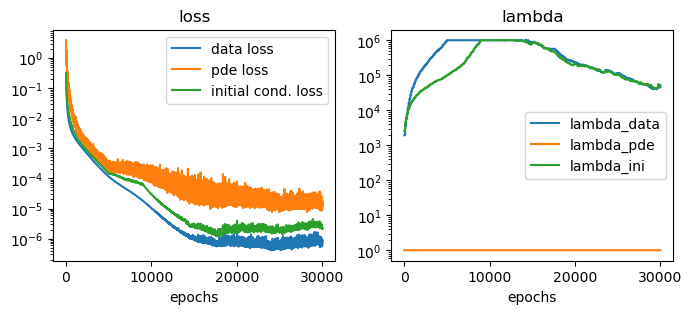

In [10]:
# Plot loss and lambda
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8, 3))
ax1.title.set_text('loss')
ax1.plot(loss_data_hist, label="data loss")
ax1.plot(np.asarray(loss_pde_hist)*np.asarray(lamb_pde_hist)/np.asarray(lamb_data_hist), label="pde loss")
ax1.plot(np.asarray(loss_ini_hist)*np.asarray(lamb_ini_hist)/np.asarray(lamb_data_hist), label="initial cond. loss")
ax1.legend()
ax1.set_yscale("log")   
ax1.set_xlabel("epochs")
ax2.title.set_text('lambda')
ax2.plot(lamb_data_hist, label="lambda_data")
ax2.plot(lamb_pde_hist, label="lambda_pde")
ax2.plot(lamb_ini_hist, label="lambda_ini")
ax2.legend()
ax2.set_yscale("log")   
ax2.set_xlabel("epochs")
plt.show()

In [11]:
# Plot reference and estimation
p_est = model(r_ref)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, n_T))
p_max = np.max(np.abs(p_ref))
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Reference')
ax2.title.set_text('Estimated')
for i in range(0, n_T):   
    img1 = ax1.imshow(p_ref[:,:,i], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    img2 = ax2.imshow(np.reshape(p_est[:,i], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    frames.append([img1, img2])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)


In [12]:
plt.close()

As we leaned a continuous function, we can estimate the pressure at arbitrary $x,y,t$ in the domain. 

In [13]:
t_hr = np.linspace(0, T, n_T*3)
r_hr = np.linspace(0, L, n_L*3)

x_hr, y_hr = np.meshgrid(r_hr, r_hr)
r_hr = np.column_stack((np.reshape(x_hr,(-1,1)), np.reshape(y_hr,(-1,1))))
r_hr = xyt_tensor(r_hr, t_hr)

p_est = model(r_hr)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, n_T*3))
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, ax = plt.subplots()
ax.title.set_text('Estimated high res')
for i in range(0, n_T*3):   
    img = ax.imshow(np.reshape(p_est[:,i], (n_L*3, n_L*3)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    frames.append([img])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)

In [14]:
plt.close()

###  Absorbing Boundary Conditions (ABCs)
We can see that the constraints (observed data, initial condition and PDE) are satisfied but the resulting wavefield is not what we expected. There is a non-causal wave propagating from outside the domain. 
To account for physical causality during training, time domain decompositions ([Ren 2024], https://doi.org/10.1016/j.cpc.2023.109010) and time-weighting schemes ([Wang 2024] https://doi.org/10.1016/j.cma.2024.116813) have been proposed. 

Before getting into that, let's try to constrain the problem more by adding addional BCs. This might help with the problem conditioning. In particular, ABCs can be very useful in semi-infinite domains as there won't be reflected waves coming from outside the domain. 
We implemented a second-order Clayton and Engquist ABC, which has a good accuracy-complexity trade-off (see [Gao 2015] https://doi.org/10.1071/EG15068). We anticipate that the ABCs might be a problem in when we try to estimate the velocity field, as these absoption might be accounted for by a change in the velocity close to the boundaries. We will se that in the next notebook. 


In [15]:
lamb = [1, 1, 1, 1] # initialise lambdas
n_bound = 5
n_epochs = int(3e4)

model = FCN(n_in, n_out, n_ffeatures, n_hidden, n_layers)
model = model.to(device)
model.apply(weights_init)

optimiser = torch.optim.Adam(model.parameters(), lr=1e-4)

loss_data_hist = []
loss_pde_hist = []
loss_ini_hist = []
loss_bound_hist = []
lamb_data_hist = []
lamb_pde_hist = []
lamb_ini_hist = []
lamb_bound_hist = []

In [16]:
for i in tqdm(range(n_epochs)):
    optimiser.zero_grad()
    
    # initial condition loss
    p = model(r_ini)
    p = p.reshape(-1, 2)
    loss_ini = mse_loss(p, p_ini)

    # absorbing boundary conditions
    loss_bound = torch.zeros_like(loss_ini).requires_grad_(True)
    for j in range(4):
        r_bound = rand_bound(L, T, n_bound, j+1)
        p = model(r_bound)
        res_bound = absorbing_boundary(p, r_bound, j+1, c)
        loss_bound = loss_bound + mse_loss(res_bound, torch.zeros_like(res_bound))

    # data loss
    p = model(r_data)
    p = p.reshape(-1, n_T)
    loss_data = mse_loss(p, p_data)

    # pde loss
    r_colloc = rand_colloc(L, T, n_colloc)
    p = model(r_colloc)
    pde_res = pde(p, r_colloc, c)
    loss_pde = mse_loss(pde_res, torch.zeros_like(p))

    loss_lst = [loss_data, loss_pde, loss_ini, loss_bound]

    # get gradients and update lambda
    if i % n_lamb_update == 0: 
        lamb = update_lambda(model, loss_lst, lamb, 0.9)

    # total loss
    loss = loss_data + loss_pde*lamb[1]/lamb[0] + loss_ini*lamb[2]/lamb[0] + loss_bound*lamb[3]/lamb[0] 

    # backpropagate
    loss.backward()
    optimiser.step()

    # log
    loss_data_hist.append(loss_data.numpy(force=True))
    loss_pde_hist.append(loss_pde.numpy(force=True))
    loss_ini_hist.append(loss_ini.numpy(force=True))
    loss_bound_hist.append(loss_bound.numpy(force=True))
    lamb_data_hist.append(lamb[0])
    lamb_pde_hist.append(lamb[1])
    lamb_ini_hist.append(lamb[2])
    lamb_bound_hist.append(lamb[3])

    # print loss
    if i % 500 == 499:    # print every 500 epochs
        print('[%5d] loss: %.3f*1e-3' %
        (i + 1, loss.item()*1e3))

  2%|▏         | 502/30000 [00:19<23:00, 21.37it/s]

[  500] loss: 65.616*1e-3


  3%|▎         | 1000/30000 [00:37<17:40, 27.34it/s]

[ 1000] loss: 18.604*1e-3


  5%|▌         | 1501/30000 [00:57<22:22, 21.23it/s]

[ 1500] loss: 11.314*1e-3


  7%|▋         | 2002/30000 [01:16<22:31, 20.72it/s]

[ 2000] loss: 7.701*1e-3


  8%|▊         | 2500/30000 [01:35<17:04, 26.84it/s]

[ 2500] loss: 5.032*1e-3


 10%|█         | 3001/30000 [01:54<20:58, 21.46it/s]

[ 3000] loss: 3.162*1e-3


 12%|█▏        | 3501/30000 [02:13<19:07, 23.10it/s]

[ 3500] loss: 2.088*1e-3


 13%|█▎        | 4002/30000 [02:32<19:55, 21.76it/s]

[ 4000] loss: 1.567*1e-3


 15%|█▌        | 4500/30000 [02:50<15:25, 27.54it/s]

[ 4500] loss: 1.068*1e-3


 17%|█▋        | 5002/30000 [03:08<19:19, 21.57it/s]

[ 5000] loss: 1.170*1e-3


 18%|█▊        | 5501/30000 [03:27<16:16, 25.10it/s]

[ 5500] loss: 0.924*1e-3


 20%|██        | 6001/30000 [03:42<14:00, 28.55it/s]

[ 6000] loss: 0.720*1e-3


 22%|██▏       | 6501/30000 [03:57<14:37, 26.78it/s]

[ 6500] loss: 0.714*1e-3


 23%|██▎       | 7001/30000 [04:13<13:45, 27.85it/s]

[ 7000] loss: 0.765*1e-3


 25%|██▌       | 7504/30000 [04:29<13:16, 28.24it/s]

[ 7500] loss: 0.487*1e-3


 27%|██▋       | 8002/30000 [04:44<13:33, 27.03it/s]

[ 8000] loss: 0.420*1e-3


 28%|██▊       | 8502/30000 [05:00<12:44, 28.13it/s]

[ 8500] loss: 0.591*1e-3


 30%|███       | 9001/30000 [05:16<12:54, 27.12it/s]

[ 9000] loss: 0.281*1e-3


 32%|███▏      | 9501/30000 [05:31<12:25, 27.49it/s]

[ 9500] loss: 0.280*1e-3


 33%|███▎      | 10001/30000 [05:47<12:09, 27.43it/s]

[10000] loss: 0.306*1e-3


 35%|███▌      | 10503/30000 [06:02<11:45, 27.64it/s]

[10500] loss: 0.258*1e-3


 37%|███▋      | 11003/30000 [06:18<11:54, 26.58it/s]

[11000] loss: 0.197*1e-3


 38%|███▊      | 11502/30000 [06:34<11:13, 27.46it/s]

[11500] loss: 0.173*1e-3


 40%|████      | 12004/30000 [06:49<10:45, 27.90it/s]

[12000] loss: 0.153*1e-3


 42%|████▏     | 12502/30000 [07:05<10:27, 27.88it/s]

[12500] loss: 0.127*1e-3


 43%|████▎     | 13004/30000 [07:21<10:20, 27.41it/s]

[13000] loss: 0.069*1e-3


 45%|████▌     | 13503/30000 [07:37<09:50, 27.92it/s]

[13500] loss: 0.071*1e-3


 47%|████▋     | 14003/30000 [07:53<09:28, 28.15it/s]

[14000] loss: 0.076*1e-3


 48%|████▊     | 14502/30000 [08:09<09:19, 27.68it/s]

[14500] loss: 0.217*1e-3


 50%|█████     | 15002/30000 [08:24<08:53, 28.12it/s]

[15000] loss: 0.078*1e-3


 52%|█████▏    | 15503/30000 [08:40<08:39, 27.92it/s]

[15500] loss: 0.099*1e-3


 53%|█████▎    | 16004/30000 [08:55<08:25, 27.69it/s]

[16000] loss: 0.098*1e-3


 55%|█████▌    | 16504/30000 [09:11<08:02, 27.97it/s]

[16500] loss: 0.118*1e-3


 57%|█████▋    | 17001/30000 [09:26<07:40, 28.23it/s]

[17000] loss: 0.077*1e-3


 58%|█████▊    | 17504/30000 [09:41<07:20, 28.39it/s]

[17500] loss: 0.083*1e-3


 60%|██████    | 18004/30000 [09:57<07:08, 27.97it/s]

[18000] loss: 0.065*1e-3


 62%|██████▏   | 18503/30000 [10:13<07:16, 26.34it/s]

[18500] loss: 0.095*1e-3


 63%|██████▎   | 19002/30000 [10:29<06:42, 27.32it/s]

[19000] loss: 0.098*1e-3


 65%|██████▌   | 19503/30000 [10:44<06:18, 27.72it/s]

[19500] loss: 0.068*1e-3


 67%|██████▋   | 20003/30000 [11:00<06:07, 27.23it/s]

[20000] loss: 0.102*1e-3


 68%|██████▊   | 20503/30000 [11:16<05:42, 27.71it/s]

[20500] loss: 0.057*1e-3


 70%|███████   | 21002/30000 [11:32<05:25, 27.64it/s]

[21000] loss: 0.085*1e-3


 72%|███████▏  | 21502/30000 [11:47<05:00, 28.25it/s]

[21500] loss: 0.056*1e-3


 73%|███████▎  | 22004/30000 [12:03<04:39, 28.57it/s]

[22000] loss: 0.106*1e-3


 75%|███████▌  | 22504/30000 [12:18<04:20, 28.80it/s]

[22500] loss: 0.046*1e-3


 77%|███████▋  | 23001/30000 [12:33<04:04, 28.59it/s]

[23000] loss: 0.157*1e-3


 78%|███████▊  | 23504/30000 [12:49<03:50, 28.19it/s]

[23500] loss: 0.053*1e-3


 80%|████████  | 24003/30000 [13:04<03:32, 28.27it/s]

[24000] loss: 0.039*1e-3


 82%|████████▏ | 24501/30000 [13:19<03:15, 28.20it/s]

[24500] loss: 0.053*1e-3


 83%|████████▎ | 25001/30000 [13:34<02:56, 28.29it/s]

[25000] loss: 0.050*1e-3


 85%|████████▌ | 25501/30000 [13:49<02:41, 27.77it/s]

[25500] loss: 0.059*1e-3


 87%|████████▋ | 26001/30000 [14:04<02:16, 29.25it/s]

[26000] loss: 0.080*1e-3


 88%|████████▊ | 26501/30000 [14:19<02:06, 27.74it/s]

[26500] loss: 0.081*1e-3


 90%|█████████ | 27001/30000 [14:33<01:43, 28.87it/s]

[27000] loss: 0.055*1e-3


 92%|█████████▏| 27503/30000 [14:48<01:35, 26.13it/s]

[27500] loss: 0.327*1e-3


 93%|█████████▎| 28001/30000 [15:03<01:08, 29.15it/s]

[28000] loss: 0.052*1e-3


 95%|█████████▌| 28504/30000 [15:20<00:51, 28.94it/s]

[28500] loss: 0.057*1e-3


 97%|█████████▋| 29004/30000 [15:35<00:34, 29.10it/s]

[29000] loss: 0.044*1e-3


 98%|█████████▊| 29503/30000 [15:49<00:17, 28.45it/s]

[29500] loss: 0.077*1e-3


100%|██████████| 30000/30000 [16:04<00:00, 31.10it/s]

[30000] loss: 0.078*1e-3


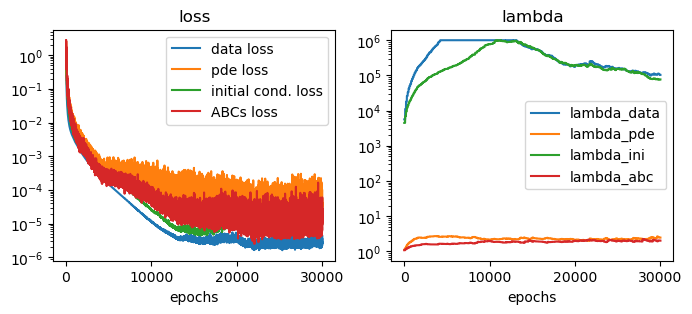

In [17]:
# Plot loss and lambda
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8, 3))
ax1.title.set_text('loss')
ax1.plot(loss_data_hist, label="data loss")
ax1.plot(np.asarray(loss_pde_hist)*np.asarray(lamb_pde_hist)/np.asarray(lamb_data_hist), label="pde loss")
ax1.plot(np.asarray(loss_ini_hist)*np.asarray(lamb_ini_hist)/np.asarray(lamb_data_hist), label="initial cond. loss")
ax1.plot(np.asarray(loss_bound_hist)*np.asarray(lamb_bound_hist)/np.asarray(lamb_data_hist), label="ABCs loss")

ax1.legend()
ax1.set_yscale("log")   
ax1.set_xlabel("epochs")
ax2.title.set_text('lambda')
ax2.plot(lamb_data_hist, label="lambda_data")
ax2.plot(lamb_pde_hist, label="lambda_pde")
ax2.plot(lamb_ini_hist, label="lambda_ini")
ax2.plot(lamb_bound_hist, label="lambda_abc")
ax2.legend()
ax2.set_yscale("log")   
ax2.set_xlabel("epochs")
plt.show()

In [18]:
# Plot reference and estimation
p_est = model(r_ref)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, n_T))
p_max = np.max(np.abs(p_ref))
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Reference')
ax2.title.set_text('Estimated')
for i in range(0, n_T):   
    img1 = ax1.imshow(p_ref[:,:,i], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    img2 = ax2.imshow(np.reshape(p_est[:,i], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    frames.append([img1, img2])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)


In [19]:
plt.close()

### Causal training
In [Wang 2024] https://doi.org/10.1016/j.cma.2024.116813 it is claimed that one of the fundamental limitations of the original PINNs formulation is their inability to respect spatio-temporal causality of the modelled physical system. It is shown that (some) PINNs are biased towards minimizing the residual at later times. To enforce causality, they propose a weighting of the loss function, so that the residual at time $t_{i+1}$ is not minimized until the residual at time $t_{i}$ is below a certain level. We start by defining a time-dependent loss function,
$$\mathcal{L}_\text{pde}(t, \theta) = \frac{1}{n_l}\sum_{i=1}^{n_l} \left| \nabla^2 p_{\theta}(t,\mathbf{r}_i) - \frac{1}{c^2} \frac{\partial^2 p_{\theta}(t, \mathbf{r}_i)}{\partial t^2} \right|^2.$$
Then the weighted loss is
$$ \mathcal{L}_\text{pde}(\theta)  = \frac{1}{n_t}\sum_{i=1}^{n_t} w_i \mathcal{L}_\text{pde}(t_i, \theta).$$
The weight $w_i$ should be large if all the residuals before $t_i$, $\{ \mathcal{L}_\text{pde}(t_k, \theta) \}_{k=1}^i$, are minimized. [Wang 2024] proposes the following weighting, 
$$  w_i = \text{exp}\left(-\epsilon \sum_{k=1}^{i-1} \mathcal{L}_{pde}(t_k,\theta) \right), \quad \text{for} \quad i=2,3,\dots,n_t, $$
where $\epsilon$ is a hyperparameter that controls the steepness of the weights. 

A different strategy to achieve causality is proposed in [Mattey 2022] https://doi.org/10.1016/j.cma.2021.114474. The idea is to train the NN over successive (increasing) time segments while satisfying the obtained solution for all previous segments. In other words, we control the collocation points during traning, so that we only feed $t_{i+1}$ to the NN after minimizing the loss at $t_{i}$. Maybe that's the easiest to implement so we go for that option for now. As time segments, we are going to use the time discretization given by the observed data, and include the next time segment every `n_causal` epochs. 

- Maybe setting a fixed `n_causal` is not the best approach. I should try with something like `if loss<value: i_causal += 1`.
- *One thing that I still need to figure out is how this will affect the update of $\lambda$. I guess `n_epochs` should be large enough so that $\lambda$ has converged.*

In [20]:
n_in = 3
n_out = 1
n_ffeatures = 64
n_hidden = 64
n_layers = 3
n_colloc = 20
n_lamb_update = 100
n_bound = 5
n_epochs = int(3e4)
n_causal = int(n_epochs/n_T)
lamb = [1, 1, 1, 1]
model = FCN(n_in, n_out, n_ffeatures, n_hidden, n_layers)
model = model.to(device)
model.apply(weights_init)

optimiser = torch.optim.Adam(model.parameters(), lr=1e-4)

loss_data_hist = []
loss_pde_hist = []
loss_ini_hist = []
loss_bound_hist = []
lamb_data_hist = []
lamb_pde_hist = []
lamb_ini_hist = []
lamb_bound_hist = []

In [21]:
i_causal  = 0

for i in tqdm(range(n_epochs)):
    optimiser.zero_grad()
    
    # initial condition loss
    p = model(r_ini)
    p = p.reshape(-1, 2)
    loss_ini = mse_loss(p, p_ini)

    if i % n_causal == 0:
        i_causal += 1

    # absorbing boundary conditions
    loss_bound = torch.zeros_like(loss_ini).requires_grad_(True)
    for j in range(4):
        r_bound = rand_bound(L, t[i_causal-1], n_bound, j+1)
        p = model(r_bound)
        res_bound = absorbing_boundary(p, r_bound, j+1, c)
        loss_bound = loss_bound + mse_loss(res_bound, torch.zeros_like(res_bound))

    # data loss
    r_data = xyt_tensor(xy_data, t[0:i_causal])
    p = model(r_data)
    p = p.reshape(-1, i_causal)
    loss_data = mse_loss(p, p_data[:,0:i_causal])

    # pde loss
    r_colloc = rand_colloc(L, t[i_causal-1], n_colloc)
    p = model(r_colloc)
    pde_res = pde(p, r_colloc, c)
    loss_pde = mse_loss(pde_res, torch.zeros_like(p))

    loss_lst = [loss_data, loss_pde, loss_ini, loss_bound]

    # get gradients and update lambda
    if i % n_lamb_update == 0: 
        lamb = update_lambda(model, loss_lst, lamb, 0.9)

    # total loss
    loss = loss_data + loss_pde*lamb[1]/lamb[0] + loss_ini*lamb[2]/lamb[0] + loss_bound*lamb[3]/lamb[0] 

    # backpropagate
    loss.backward()
    optimiser.step()

    # log
    loss_data_hist.append(loss_data.numpy(force=True))
    loss_pde_hist.append(loss_pde.numpy(force=True))
    loss_ini_hist.append(loss_ini.numpy(force=True))
    loss_bound_hist.append(loss_bound.numpy(force=True))
    lamb_data_hist.append(lamb[0])
    lamb_pde_hist.append(lamb[1])
    lamb_ini_hist.append(lamb[2])
    lamb_bound_hist.append(lamb[3])

    # print loss
    if i % 500 == 499:    # print every 500 epochs
        print('[%5d] loss: %.3f*1e-3' %
        (i + 1, loss.item()*1e3))

  2%|▏         | 503/30000 [00:15<17:04, 28.81it/s]

[  500] loss: 27.990*1e-3


  3%|▎         | 1003/30000 [00:30<16:48, 28.74it/s]

[ 1000] loss: 4.759*1e-3


  5%|▌         | 1504/30000 [00:45<16:28, 28.83it/s]

[ 1500] loss: 3.853*1e-3


  7%|▋         | 2003/30000 [01:00<16:03, 29.05it/s]

[ 2000] loss: 3.761*1e-3


  8%|▊         | 2503/30000 [01:15<15:55, 28.77it/s]

[ 2500] loss: 3.230*1e-3


 10%|█         | 3001/30000 [01:31<15:50, 28.42it/s]

[ 3000] loss: 2.481*1e-3


 12%|█▏        | 3501/30000 [01:46<15:33, 28.39it/s]

[ 3500] loss: 2.047*1e-3


 13%|█▎        | 4001/30000 [02:02<15:14, 28.43it/s]

[ 4000] loss: 1.548*1e-3


 15%|█▌        | 4501/30000 [02:18<15:25, 27.56it/s]

[ 4500] loss: 2.231*1e-3


 17%|█▋        | 5001/30000 [02:33<16:13, 25.67it/s]

[ 5000] loss: 1.379*1e-3


 18%|█▊        | 5501/30000 [02:49<15:11, 26.89it/s]

[ 5500] loss: 1.781*1e-3


 20%|██        | 6001/30000 [03:04<14:03, 28.45it/s]

[ 6000] loss: 1.025*1e-3


 22%|██▏       | 6501/30000 [03:20<14:05, 27.79it/s]

[ 6500] loss: 1.502*1e-3


 23%|██▎       | 7001/30000 [03:35<13:30, 28.38it/s]

[ 7000] loss: 0.834*1e-3


 25%|██▌       | 7501/30000 [03:50<13:32, 27.71it/s]

[ 7500] loss: 1.078*1e-3


 27%|██▋       | 8001/30000 [04:05<12:31, 29.28it/s]

[ 8000] loss: 0.596*1e-3


 28%|██▊       | 8501/30000 [04:20<12:56, 27.70it/s]

[ 8500] loss: 0.573*1e-3


 30%|███       | 9001/30000 [04:35<11:56, 29.29it/s]

[ 9000] loss: 0.428*1e-3


 32%|███▏      | 9501/30000 [04:50<11:43, 29.16it/s]

[ 9500] loss: 0.331*1e-3


 33%|███▎      | 10001/30000 [05:05<11:24, 29.20it/s]

[10000] loss: 0.290*1e-3


 35%|███▌      | 10501/30000 [05:20<11:35, 28.04it/s]

[10500] loss: 0.153*1e-3


 37%|███▋      | 11004/30000 [05:36<11:12, 28.26it/s]

[11000] loss: 0.299*1e-3


 38%|███▊      | 11504/30000 [05:50<10:34, 29.16it/s]

[11500] loss: 0.202*1e-3


 40%|████      | 12004/30000 [06:05<10:09, 29.52it/s]

[12000] loss: 0.223*1e-3


 42%|████▏     | 12504/30000 [06:20<09:57, 29.27it/s]

[12500] loss: 0.090*1e-3


 43%|████▎     | 13003/30000 [06:35<10:16, 27.56it/s]

[13000] loss: 0.111*1e-3


 45%|████▌     | 13502/30000 [06:50<09:19, 29.47it/s]

[13500] loss: 0.186*1e-3


 47%|████▋     | 14002/30000 [07:08<10:45, 24.80it/s]

[14000] loss: 0.079*1e-3


 48%|████▊     | 14502/30000 [07:24<09:36, 26.87it/s]

[14500] loss: 0.098*1e-3


 50%|█████     | 15002/30000 [07:40<09:44, 25.68it/s]

[15000] loss: 0.086*1e-3


 52%|█████▏    | 15503/30000 [07:57<10:05, 23.96it/s]

[15500] loss: 0.077*1e-3


 53%|█████▎    | 16000/30000 [08:13<07:20, 31.81it/s]

[16000] loss: 0.082*1e-3


 55%|█████▌    | 16501/30000 [08:30<08:34, 26.24it/s]

[16500] loss: 0.090*1e-3


 57%|█████▋    | 17000/30000 [08:46<07:00, 30.92it/s]

[17000] loss: 0.079*1e-3


 58%|█████▊    | 17501/30000 [09:03<08:16, 25.19it/s]

[17500] loss: 0.077*1e-3


 60%|██████    | 18001/30000 [09:19<07:39, 26.09it/s]

[18000] loss: 0.147*1e-3


 62%|██████▏   | 18502/30000 [09:36<07:39, 25.04it/s]

[18500] loss: 0.165*1e-3


 63%|██████▎   | 19002/30000 [09:54<07:49, 23.41it/s]

[19000] loss: 0.085*1e-3


 65%|██████▌   | 19502/30000 [10:12<07:05, 24.66it/s]

[19500] loss: 0.059*1e-3


 67%|██████▋   | 20000/30000 [10:29<05:10, 32.19it/s]

[20000] loss: 0.081*1e-3


 68%|██████▊   | 20501/30000 [10:47<07:36, 20.81it/s]

[20500] loss: 0.062*1e-3


 70%|███████   | 21001/30000 [11:06<06:18, 23.79it/s]

[21000] loss: 0.051*1e-3


 72%|███████▏  | 21501/30000 [11:24<06:54, 20.50it/s]

[21500] loss: 0.079*1e-3


 73%|███████▎  | 22003/30000 [11:42<05:35, 23.80it/s]

[22000] loss: 0.058*1e-3


 75%|███████▌  | 22500/30000 [11:58<03:56, 31.70it/s]

[22500] loss: 0.058*1e-3


 77%|███████▋  | 23003/30000 [12:15<04:26, 26.29it/s]

[23000] loss: 0.054*1e-3


 78%|███████▊  | 23501/30000 [12:31<04:05, 26.44it/s]

[23500] loss: 0.088*1e-3


 80%|████████  | 24000/30000 [12:48<03:13, 31.06it/s]

[24000] loss: 0.075*1e-3


 82%|████████▏ | 24501/30000 [13:05<03:31, 25.97it/s]

[24500] loss: 0.072*1e-3


 83%|████████▎ | 25003/30000 [13:21<03:08, 26.53it/s]

[25000] loss: 0.069*1e-3


 85%|████████▌ | 25502/30000 [13:38<03:01, 24.80it/s]

[25500] loss: 0.108*1e-3


 87%|████████▋ | 26002/30000 [13:54<02:29, 26.71it/s]

[26000] loss: 0.105*1e-3


 88%|████████▊ | 26500/30000 [14:11<01:55, 30.33it/s]

[26500] loss: 0.128*1e-3


 90%|█████████ | 27001/30000 [14:28<02:04, 24.05it/s]

[27000] loss: 0.081*1e-3


 92%|█████████▏| 27501/30000 [14:47<02:02, 20.34it/s]

[27500] loss: 0.055*1e-3


 93%|█████████▎| 27999/30000 [15:06<01:26, 23.10it/s]

[28000] loss: 0.064*1e-3


 95%|█████████▌| 28500/30000 [15:27<01:07, 22.23it/s]

[28500] loss: 0.102*1e-3


 97%|█████████▋| 29000/30000 [15:46<00:32, 30.59it/s]

[29000] loss: 0.077*1e-3


 98%|█████████▊| 29503/30000 [16:03<00:19, 24.86it/s]

[29500] loss: 0.065*1e-3


100%|██████████| 30000/30000 [16:20<00:00, 30.59it/s]

[30000] loss: 0.077*1e-3


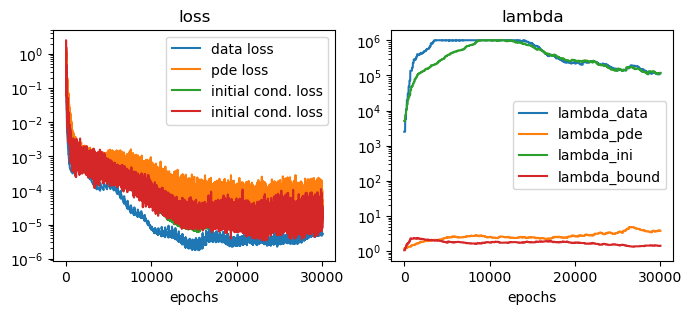

In [22]:
# Plot loss and lambda
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8, 3))
ax1.title.set_text('loss')
ax1.plot(loss_data_hist, label="data loss")
ax1.plot(np.asarray(loss_pde_hist)*np.asarray(lamb_pde_hist)/np.asarray(lamb_data_hist), label="pde loss")
ax1.plot(np.asarray(loss_ini_hist)*np.asarray(lamb_ini_hist)/np.asarray(lamb_data_hist), label="initial cond. loss")
ax1.plot(np.asarray(loss_bound_hist)*np.asarray(lamb_bound_hist)/np.asarray(lamb_data_hist), label="initial cond. loss")

ax1.legend()
ax1.set_yscale("log")   
ax1.set_xlabel("epochs")
ax2.title.set_text('lambda')
ax2.plot(lamb_data_hist, label="lambda_data")
ax2.plot(lamb_pde_hist, label="lambda_pde")
ax2.plot(lamb_ini_hist, label="lambda_ini")
ax2.plot(lamb_bound_hist, label="lambda_bound")
ax2.legend()
ax2.set_yscale("log")   
ax2.set_xlabel("epochs")
plt.show()

In [23]:
# Plot reference and estimation
p_est = model(r_ref)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, n_T))
p_max = np.max(np.abs(p_ref))
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Reference')
ax2.title.set_text('Estimated')
for i in range(0, n_T):   
    img1 = ax1.imshow(p_ref[:,:,i], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    img2 = ax2.imshow(np.reshape(p_est[:,i], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    frames.append([img1, img2])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)
